# **Flooding in Italy - working code**

In [1]:
import sys; sys.path.append('/home/clair/wwa')
from wwa import *

# define smaller region for selection of data
xn = 9; xx = 14; yn = 42; yx = 46

---
## **Data pre-processing**

Datasets used:
- MSWEP: https://www.gloh2o.org/mswep/
- CHIRPS: https://data.chc.ucsb.edu/products/CHIRPS-2.0/global_daily/netcdf/p05/
- CPC: https://psl.noaa.gov/data/gridded/data.cpc.globalprecip.html
- ERA5: processed by Mariam

CPC does not capture earlier wet years, so not included in final analysis: instead, using MSWEP, ERA5 & station composite provided by Chen Lu.


### **MSWEP**



In [ ]:
# too much data to read & save in one go - save each year individually
for y in range(1979, 2021):
    
    new_fnm = "data/mswep_daily_"+"-".join([str(p) for p in [xn,xx,yn,yx]])+"_"+str(y)+".nc"
    if len(glob.glob(new_fnm)) > 0: continue

    ds = xr.open_mfdataset("/home/clair/Data/mswep_past/"+str(y)+"*.nc").sel(lon = slice(xn,xx), lat = slice(yx,yn)).rename(precipitation = "precip")
    ds.sortby(ds.lat).to_netcdf("data/mswep_daily_"+"-".join([str(p) for p in [xn,xx,yn,yx]])+"_"+str(y)+".nc")

In [2]:
for y in range(2021, 2024):
    
    new_fnm = "data/mswep_daily_"+"-".join([str(p) for p in [xn,xx,yn,yx]])+"_"+str(y)+".nc"
    if len(glob.glob(new_fnm)) > 0: continue
    
    ds = xr.open_mfdataset("/home/clair/Data/mswep_nrt/"+str(y)+"*.nc").sel(lon = slice(xn,xx), lat = slice(yx,yn)).rename(precipitation = "precip")
    ds.sortby(ds.lat).to_netcdf(new_fnm)

### **CPC**

In [12]:
cpc = xr.open_mfdataset("/home/clair/Data/cpc/precip.*.nc").sel(lon = slice(xn,xx), lat = slice(yx,yn))
cpc.sortby(cpc.lat).to_netcdf("data/cpc_daily_"+"-".join([str(p) for p in [xn,xx,yn,yx]])+".nc")

### **CHIRPS**

In [ ]:
chirps = xr.open_mfdataset("/home/clair/Data/chirps_05/*.nc").rename(latitude = "lat", longitude = "lon").sel(lon = slice(xn,xx), lat = slice(yn,yx))
chirps.sortby(chirps.lat).to_netcdf("data/chirps_daily_"+"-".join([str(p) for p in [xn,xx,yn,yx]])+".nc")

### **E-Obs**

In [3]:
eobs = xr.open_mfdataset("/home/clair/Data/e-obs_025/rr_ens_mean_0.25deg_reg_*_v26.0e.nc").rr.rename("precip", latitude = "lat", longitude = "lon").sel(lon = slice(xn,xx), lat = slice(yn,yx))
eobs.to_netcdf("data/eobs_daily_"+"-".join([str(p) for p in [xn,xx,yn,yx]])+".nc")

### **CORDEX**

EUR-11 precip data is about 1.5Tb: too big to download to hpc in one hit.  
Download files in batches, save subset & delete raw files to make space for next batch

In [ ]:
# lat-lon bounds for selection of data
xn = 5; xx = 20; yn = 35; yx = 50

varnm = "pr"
units = "mm/day"

# get list of available files, check against files already processed
synda_fl = glob.glob("../synda/data/CORDEX/EUR-11/*/*/*/day/"+varnm+"/*.nc")
synda_fl = [fnm for fnm in synda_fl if int(fnm[-20:-16]) <= 2050]
fl = glob.glob("*.nc")

fl_to_process = [fnm for fnm in synda_fl if not fnm.split("/")[-1] in fl]

In [ ]:
# first, extract rectangular region over Italy from raw data downloaded using synda
# loop over unprocessed files & save subset locally
for fnm in fl_to_process:

    if os.path.exists(fnm.split("/")[-1]): continue
    da = convert_units_to(xr.open_dataset(fnm)[varnm], units)

    if "rlon" in da.dims:
        x_dim, y_dim = ["rlon", "rlat"]
    elif "x" in da.dims:
        x_dim, y_dim = ["x", "y"]
   
    # MPI-ESM-LR_rcp85_r1i1p1_IPSL-WRF381P has no x or y coords - use dummy coords to match other WRF381P run
    if all(da[x_dim] == 0):
        da = da.assign_coords({x_dim : list(np.arange(0, len(da[x_dim])*12.5, 12.5))})
    if all(da[y_dim] == 0):
        da = da.assign_coords({y_dim : list(np.arange(0, len(da[y_dim])*12.5, 12.5))})

    if "latitude" in da.coords: da = da.rename(latitude = "lat")
    if "longitude" in da.coords: da = da.rename(longitude = "lon")
        
    # fix typos in coordinates (mainly CNRM-CM5_ALADIN63)
    if len(np.unique(da[x_dim])) != len(da[x_dim]):
        da = da.assign_coords({x_dim : list(np.arange(da[x_dim].min(), da[x_dim].max()+1, np.diff(da[x_dim][:2])[0]))})
    if len(np.unique(da[y_dim])) != len(da[y_dim]):
        da = da.assign_coords({y_dim : list(np.arange(da[y_dim].min(), da[y_dim].max()+1, np.diff(da[y_dim][:2])[0]))})
        
    # trim data to area required
    sp_mask = np.logical_and(np.logical_and(da.lat > yn, da.lat < yx), np.logical_and(da.lon > xn, da.lon < xx))
    sp_mask = sp_mask.where(sp_mask == 1).dropna(x_dim, "all").dropna(y_dim, "all")
    da = da.sel({x_dim : sp_mask[x_dim], y_dim : sp_mask[y_dim], "time" : slice(None, "2050")})

    # save individual files to netcdf (quicker than compiling in advance)
    da.to_netcdf(fnm.split("/")[-1])
    print(".", end = "")

print("")

In [ ]:
# list completed runs (these can be uninstalled using Synda)
for fpath in glob.glob("../synda/data/CORDEX/EUR-11/*/*/*/day/pr/"):
    
    synda_fl = glob.glob(fpath+"*.nc")
    if len(synda_fl) == 0: continue
        
    synda_fl = [fnm for fnm in synda_fl if int(fnm[-20:-16]) <= 2050]
    fnm_patn = re.sub("rcp85", "*", re.sub("historical", "*", "_".join(synda_fl[0].split("/")[-1].split("_")[:-1])+"*.nc"))
    
    if len(glob.glob(fnm_patn)) == len(synda_fl):
        print(fpath, len(glob.glob(fnm_patn)), len(synda_fl))

In [ ]:
# Extract time series & spatial pattern from subset
sf = gpd.read_file("sf_emilia-romagna/")
run_list = list(set([re.sub("historical", "rcp85", "_".join(fnm.split("_")[:-1])) for fnm in glob.glob("*.nc")]))

for run in run_list:
    
    if run in ["pr_EUR-11_MOHC-HadGEM2-ES_rcp85_r1i1p1_ICTP-RegCM4-6_v1_day"]: continue
    if len(glob.glob("cordex/"+run+"*.nc")) == 2: continue
    
    print(run)
    fl = glob.glob(re.sub("rcp85", "*", run)+"*.nc")
    
    da = xr.open_mfdataset(fl).pr
    
    if "rlon" in da.dims:
        x_dim, y_dim = ["rlon", "rlat"]
    elif "x" in da.dims:
        x_dim, y_dim = ["x", "y"]
    
    # get timeseries over Emilia-Romagna region
    rm = regionmask.mask_3D_geopandas(sf, da.lon, da.lat).squeeze(drop = True)
    ts = da.where(rm).mean([x_dim, y_dim])
    ts.to_netcdf("cordex/"+run+"_ts.nc")
    
    # monthly spatial patterns (not sure which months we'll need, so keep all)
    sp = da.sel(time = slice("1980", "2022")).groupby("time.month").mean()
    sp.to_netcdf("cordex/"+run+"_sp.nc")

---
### **UKCP18**

Run on Jasmin, using CEDA archived data

In [ ]:
# lat-lon bounds for spatial pattern
xn = 5; xx = 20; yn = 35; yx = 50

varnm = "pr"
units = "mm/day"

sf = gpd.read_file("sf_emilia-romagna")

In [ ]:
# get lat & lon coords
ds = xr.open_dataset("/badc/ukcp18/data/land-rcm/eur/12km/rcp85/01/pr/day/latest/pr_rcp85_land-rcm_eur_12km_01_day_19801201-19901130.nc").isel(time = 0).squeeze(drop = True).reset_coords(drop = True)
ukcp_crs = ccrs.RotatedPole(pole_longitude = 198.0, pole_latitude = 39.25, globe = ccrs.Globe(semimajor_axis = 6371229.0))

# expand rlats & rlons into array
rlon_2d = np.tile(np.array(ds.grid_longitude), (len(ds.grid_latitude), 1))
rlat_2d = np.tile(np.array([ds.grid_latitude]).transpose(), (1, len(ds.grid_longitude)))

# project rlats & rlons onto lat-lon grid & unpack
xy_transf = ccrs.PlateCarree().transform_points(ukcp_crs, rlon_2d, rlat_2d)
lons, lats = [xy_transf[:,:,0], xy_transf[:,:,1]]

# create spatial mask (rectangular region over Italy) with lat & lon as auxiliary coordinates
sp_mask = np.logical_and(np.logical_and(lats > yn, lats < yx), np.logical_and(lons > xn, lons < xx))
sp_mask = ds.pr.where(sp_mask == 1).assign_coords(lon = (["grid_latitude", "grid_longitude"], lons), lat = (["grid_latitude", "grid_longitude"], lats))
sp_mask = sp_mask.dropna("grid_latitude", "all").dropna("grid_longitude", "all")

# create Emilia-Romagna regionmask
sf_mask = regionmask.mask_3D_geopandas(sf, lons, lats).squeeze(drop = True)
sf_mask = ds.pr.where(sf_mask.values == 1).dropna("grid_latitude", "all").dropna("grid_longitude", "all")

In [ ]:
for ens in ["01","04","05","06","07","08","09","10","11","12","13","15"]:

    da = xr.open_mfdataset("/badc/ukcp18/data/land-rcm/eur/12km/rcp85/"+ens+"/"+varnm+"/day/latest/*.nc").sel(time = slice(None, "2050"))[varnm].squeeze(drop = True)

    # trim data to rectangular region, save spatial pattern for May precipitation (add lat & lon coords for later plotting)
    sp = da.sel(grid_latitude = sp_mask.grid_latitude, grid_longitude = sp_mask.grid_longitude, time = slice("1979", "2023")).groupby("time.month")[5].mean("time")
    sp = sp.assign_coords(lon = sp_mask.lon, lat = sp_mask.lat)
    sp.to_netcdf(varnm+"_rcp85_land-rcm_eur_12km_"+ens+"_day_sp.nc")

    # save time series over Emilia-Romagna (trim region first to make computation feasible)
    da = da.sel(grid_latitude = sf_mask.grid_latitude, grid_longitude = sf_mask.grid_longitude)
    ts = da.where(~np.isnan(sf_mask)).mean(["grid_latitude", "grid_longitude"])
    ts.to_netcdf(varnm+"_rcp85_land-rcm_eur_12km_"+ens+"_day_ts.nc")

---
## **Local geography**
- places mentioned in trigger: Emilia-Romagna province; Bologna, Ravenna, Forli-Cesena
- Lamone river rose by over 10 metres within 24h
- also mentioned in news reports: Senio river; Ponticelli  
&nbsp;
- administrative shapefile data downloaded from http://www.diva-gis.org/gdata
- elevation data from http://research.jisao.washington.edu/data_sets/elevation/
- river & river basin shapefiles from https://www.hydrosheds.org/products/hydrobasins

In [2]:
# load gridded elevation data
elev = xr.open_dataset("../90_data/tbase_elev-0.25deg.nc").elev.sel(lon = slice(5,20), lat = slice(35,50))

# load administrative shapefiles
sf = gpd.read_file("sf/italy-adm1").set_index("NAME_1").loc[["Emilia-Romagna"]]

# get lat & lon of places mentioned in trigger
px = {k : get_latlon(k).values() for k in ["Bologna", "Ravenna", "Forli-Cesena", "Lamone River", "Ponticelli", "Bagnacavallo"]}

# load shapefile for river basin & clip to required extent
hb04 = gpd.read_file("sf/hybas-04").clip([xn,yn,xx,yx])

# load shapefile for rivers & clip to Emilia-Romagna region
riv = gpd.read_file("sf/hydroRIVERS/").clip(sf)

/home/clair/miniconda3/envs/wwa/lib/python3.10/site-packages/geopandas/tools/clip.py:63: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home/clair/miniconda3/envs/wwa/lib/python3.10/site-packages/geopandas/tools/clip.py:67: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


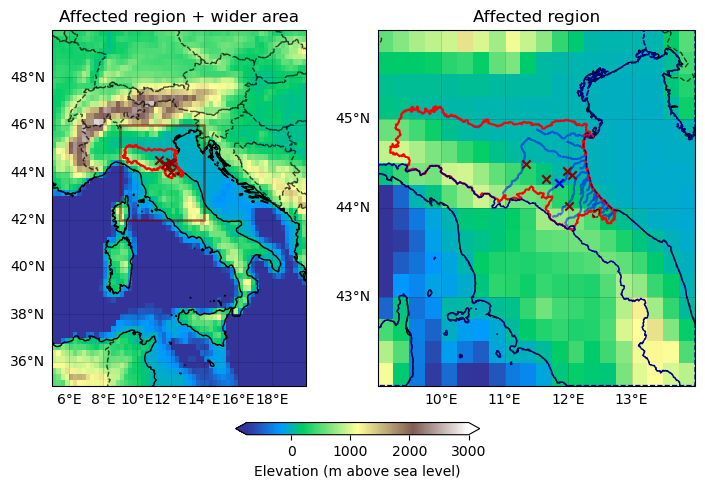

In [3]:
fig, axs = plt.subplots(ncols = 2, figsize = (9,6), dpi = 100, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
plt.subplots_adjust(wspace = 0.05)

elev_kwargs = {"cmap" : "terrain", "vmin" : -750, "vmax" : 3000, "add_colorbar" : False}

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

ax = axs[0] 
cbar = elev.plot(ax = ax, **elev_kwargs)
ax.set_title("Affected region + wider area")

ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom", "left"], alpha=0.2)

# box for smaller area
ax.plot([xn,xn,xx,xx,xn], [yn,yx,yx,yn,yn], color = "darkred", lw = 2, alpha = 0.5)

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

ax = axs[1] 
elev.sel(lon = slice(xn,xx), lat = slice(yn,yx)).plot(ax = ax, **elev_kwargs)
ax.set_title("Affected region")
hb04.boundary.plot(ax = ax, color = "darkblue", lw = 1, ls = "--", zorder = 99)

ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom", "left"], alpha=0.2, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))

riv.set_index("ORD_CLAS").loc[[1]].plot(ax = ax, color = "blue", alpha = 0.5)
[ax.scatter(*xy, marker = "x", color = "blue", zorder = 999) for k, xy in px.items() if k == "Lamone River"]

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

for ax in axs:
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
    
    sf.boundary.plot(ax = ax, color = "red")
    [ax.scatter(*xy, marker = "x", color = "darkred", zorder = 99) for xy in px.values()]

plt.colorbar(cbar, ax = axs, location = "bottom", extend = "both", shrink = 0.35, pad = 0.08, label = "Elevation (m above sea level)")

plt.savefig("fig/physical-geography.png")

### **Shapefile**

In [41]:
# load shapefile, select region, get single largest polygon
sf = gpd.read_file("sf/italy-adm1").set_index("NAME_1").loc[["Emilia-Romagna"]].explode(index_parts = True)
sf = sf.loc[[a == sf.geometry.area.max() for a in sf.geometry.area]]
sf.to_file("sf_emilia-romagna")

/tmp/ipykernel_13523/625400598.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  sf = sf.loc[[a == sf.geometry.area.max() for a in sf.geometry.area]]


---
## **Synoptic meteorology**

In [88]:
# ds = xr.open_dataset("data/adaptor.mars.internal-1684761794.6905973-28942-11-44147f8c-d4f0-4626-b304-891d16305b83.nc").resample(time = "D").mean().sortby("latitude")
# ds = ds.sel(longitude = slice(6,20), latitude = slice(41,48))
# # slp_clim = xr.open_dataset("data/adaptor.mars.internal-1684764438.3361168-14078-4-ddc66691-f9e8-47f3-9811-be565e71e581.nc").msl.mean("time")
# # slp_anom = convert_units_to(ds.msl - slp_clim, "hPa")
# slp_anom = convert_units_to(ds.msl, "hPa")

In [122]:
sf = gpd.read_file("sf_emilia-romagna")

ds = xr.open_dataset("data/slp-uv_era5.nc").sel(longitude = slice(6,20), latitude = slice(39,48))
ds["msl"] = convert_units_to(ds.msl, "hPa")

In [1]:
fig, axs = plt.subplots(ncols = 3, figsize = (15,5), dpi = 100, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})

dates = ["2023-05-02", "2023-05-10"]
for i in range(2):
    
    ax = axs[i]
    d = dates[i]
    
    cs = ax.contour(ds.longitude, ds.latitude, ds.msl.sel(time = d), cmap = "RdBu_r", vmin = 1010, vmax = 1020, levels = range(1010, 1022, 1))
    ax.clabel(cs)
    ax.quiver(ds.longitude, ds.latitude, ds.u10.sel(time = d), ds.v10.sel(time = d), alpha = 0.5)
    ax.set_title(d)
    
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "red", lw = 1)
    ax.gridlines(color = "k", alpha = 0.1, draw_labels = ["bottom", "left"], xlocs = range(6,22,2), ylocs = range(40,48,2))
    
axs[2].set_axis_off()

plt.savefig("fig/synoptic-conditions.png")

NameError: name 'plt' is not defined

---
## **Gridded datasets**

### **MSWEP**

#### **Maps of daily precip**

In [4]:
mswep_clim = xr.open_mfdataset("data/mswep_daily_9-14-42-46_19*.nc").sel(time = slice(None, "2022")).precip.groupby("time.month")[5].mean("time").load()
mswep_2023 = xr.open_mfdataset("data/mswep_daily_9-14-42-46_2023.nc").precip.groupby("time.month")[5].load()
mswep_anom = ((mswep_2023 - mswep_clim) / mswep_clim * 100)

sf = gpd.read_file("sf_emilia-romagna")

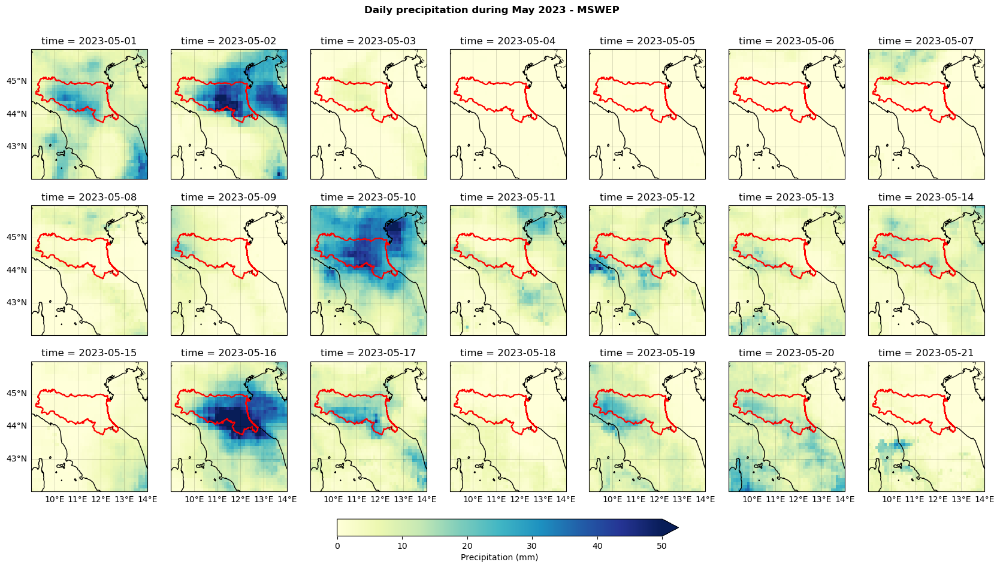

In [5]:
fig, axs = plt.subplots(ncols = 7, nrows = 3, figsize = (21,12), subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
plt.subplots_adjust(hspace = 0.2, wspace = 0.01)

for i in range(21):
    ax = fig.axes[i]
    cbar = mswep_2023.isel(time = i).plot(ax = ax, cmap = "YlGnBu", vmin = 0, vmax = 50, add_colorbar = False)
    
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
    sf.boundary.plot(ax = ax, color = "red")
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
for ax in axs[-1,:]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["bottom"], alpha=0, xlocs = range(xn+1, xx+1), ylocs = range(yn, yx+1))
for ax in axs[:,0]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["left"], alpha=0, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
plt.colorbar(cbar, ax = axs, location = "bottom", extend = "max", shrink = 0.35, pad = 0.05, label = "Precipitation (mm)")
plt.suptitle("Daily precipitation during May 2023 - MSWEP", fontweight = "bold", y = 0.94)

plt.savefig("fig/mswep-precip_2023-05.png")

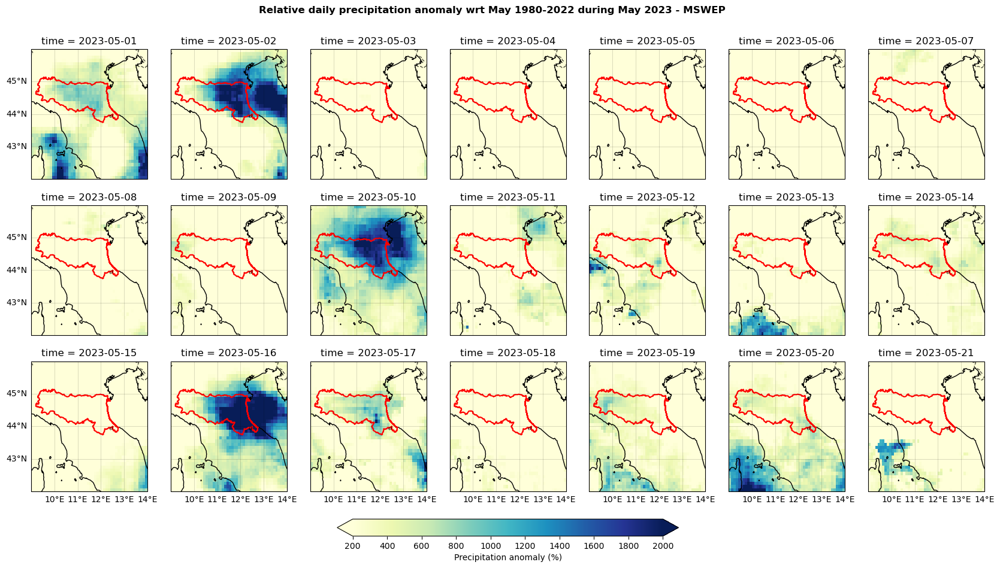

In [6]:
fig, axs = plt.subplots(ncols = 7, nrows = 3, figsize = (21,12), subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
plt.subplots_adjust(hspace = 0.2, wspace = 0.01)

for i in range(21):
    ax = fig.axes[i]
    cbar = mswep_anom.isel(time = i).plot(ax = ax, cmap = "YlGnBu", vmin = 200, vmax = 2000, add_colorbar = False)
    
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
    sf.boundary.plot(ax = ax, color = "red")
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
for ax in axs[-1,:]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["bottom"], alpha=0, xlocs = range(xn+1, xx+1), ylocs = range(yn, yx+1))
for ax in axs[:,0]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["left"], alpha=0, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
plt.colorbar(cbar, ax = axs, location = "bottom", extend = "both", shrink = 0.35, pad = 0.05, label = "Precipitation anomaly (%)")
plt.suptitle("Relative daily precipitation anomaly wrt May 1980-2022 during May 2023 - MSWEP", fontweight = "bold", y = 0.94)

plt.savefig("fig/mswep-precip-anompc_2023-05.png")

#### **Seasonal context**

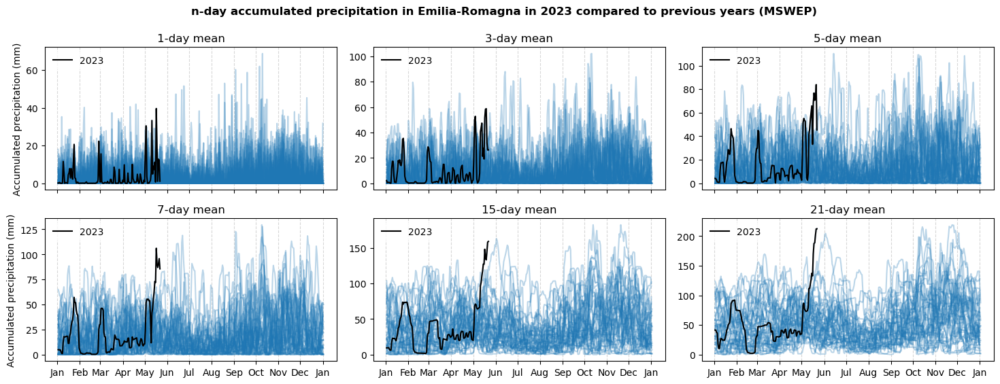

In [7]:
sf = gpd.read_file("sf/italy-adm1").set_index("NAME_1").loc[["Emilia-Romagna"]]

mswep = xr.open_mfdataset("data/mswep_daily_9-14-42-46_*.nc").precip
mswep_ts = mswep.where(regionmask.mask_3D_geopandas(sf, mswep.lon, mswep.lat, numbers = "ID_1").squeeze(drop = True) == 1).mean(["lat", "lon"]).load()

fig, axs = plt.subplots(ncols = 3, nrows = 2, figsize = (18,6), sharex = True, sharey = False)
plt.subplots_adjust(hspace = 0.2, wspace = 0.125)

ndays = [1,3,5,7,15,21]

for i in range(6):
    
    ax = fig.axes[i]
    nd = ndays[i]
    ts = mswep_ts.rolling(time = nd, center = False).sum()
    
    # plot each year individually so that the overlapping transparencies interact
    for y in set(ts.time.dt.year.values): 
        ax.plot(ts.sel(time = str(y)).time.dt.dayofyear, ts.sel(time = str(y)), color = "tab:blue", alpha = 0.3)
        
    ax.plot(ts.sel(time = "2023").time.dt.dayofyear, ts.sel(time = "2023"), color = "k", label = "2023")
    ax.legend(edgecolor = "w", loc = "upper left")
    
    sc_xlabels(dates = mswep.sel(time = slice("20180101", "20190101")).time, ax = ax)
    
    ax.set_title(str(nd)+"-day mean")
    ax.grid(axis = "x", alpha = 0.5, ls = "--")
    
for ax in axs[:,0]: ax.set_ylabel("Accumulated precipitation (mm)")

fig.suptitle("n-day accumulated precipitation in Emilia-Romagna in 2023 compared to previous years (MSWEP)", fontweight = "bold")
plt.savefig("fig/mswep_n-day-precip_Emilia-Romagna.png")

### **CPC**

#### **Maps of daily precip**

In [7]:
cpc_clim = xr.open_mfdataset("data/cpc_daily_9-14-42-46.nc").sel(time = slice(None, "2022")).precip.groupby("time.month")[5].mean("time").load()

In [8]:
cpc_2023 = xr.open_mfdataset("data/cpc_daily_9-14-42-46.nc").sel(time = "2023").precip.groupby("time.month")[5].load()
cpc_anom = ((cpc_2023 - cpc_clim) / cpc_clim * 100)

sf = gpd.read_file("sf/italy-adm1").set_index("NAME_1").loc[["Emilia-Romagna"]]

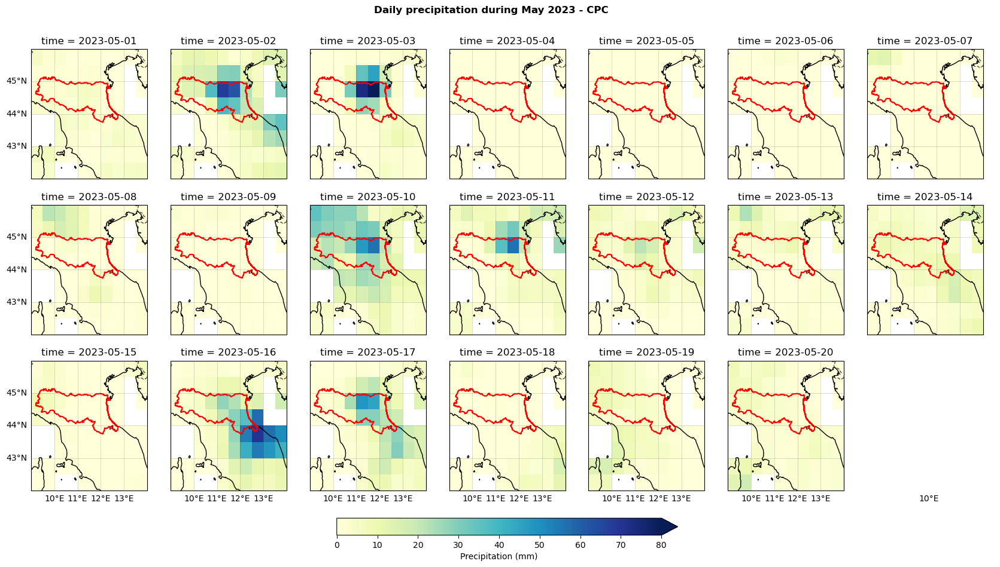

In [9]:
fig, axs = plt.subplots(ncols = 7, nrows = 3, figsize = (21,12), subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
plt.subplots_adjust(hspace = 0.2, wspace = 0.01)

for i in range(len(cpc_2023.time),21): fig.axes[i].set_axis_off()
for i in range(len(cpc_2023.time)):
    ax = fig.axes[i]
    cbar = cpc_2023.isel(time = i).plot(ax = ax, cmap = "YlGnBu", vmin = 0, vmax = 80, add_colorbar = False)
    
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
    sf.boundary.plot(ax = ax, color = "red")
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
for ax in axs[-1,:]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["bottom"], alpha=0, xlocs = range(xn+1, xx+1), ylocs = range(yn, yx+1))
for ax in axs[:,0]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["left"], alpha=0, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
plt.colorbar(cbar, ax = axs, location = "bottom", extend = "max", shrink = 0.35, pad = 0.05, label = "Precipitation (mm)")
plt.suptitle("Daily precipitation during May 2023 - CPC", fontweight = "bold", y = 0.94)

plt.savefig("fig/cpc-precip_2023-05.png")

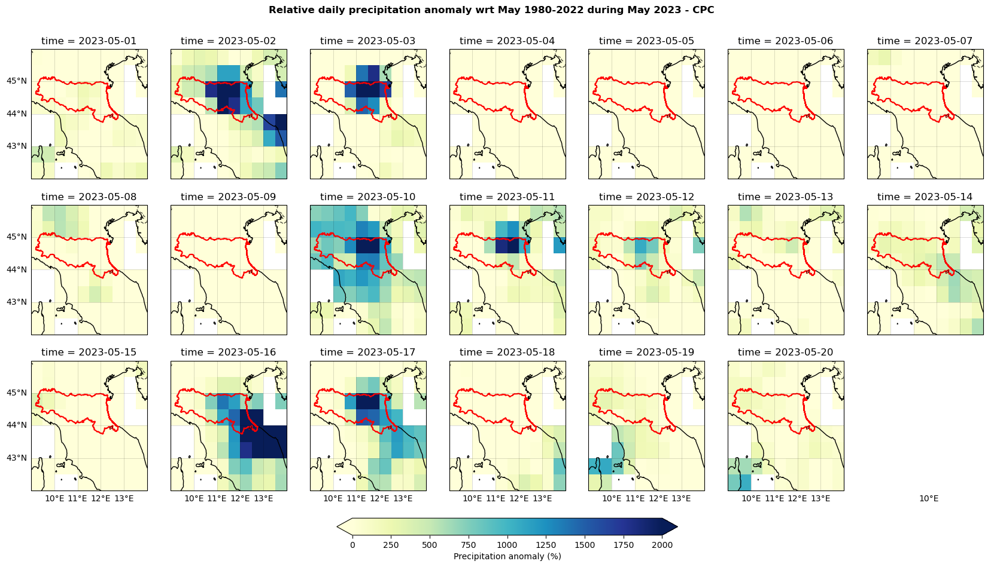

In [10]:
fig, axs = plt.subplots(ncols = 7, nrows = 3, figsize = (21,12), subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
plt.subplots_adjust(hspace = 0.2, wspace = 0.01)

for i in range(len(cpc_anom.time),21): fig.axes[i].set_axis_off()
for i in range(len(cpc_anom.time)):
    ax = fig.axes[i]
    cbar = cpc_anom.isel(time = i).plot(ax = ax, cmap = "YlGnBu", vmin = 0, vmax = 2000, add_colorbar = False)
    
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
    sf.boundary.plot(ax = ax, color = "red")
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
for ax in axs[-1,:]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["bottom"], alpha=0, xlocs = range(xn+1, xx+1), ylocs = range(yn, yx+1))
for ax in axs[:,0]:
    ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels = ["left"], alpha=0, xlocs = range(xn, xx+1), ylocs = range(yn, yx+1))
    
plt.colorbar(cbar, ax = axs, location = "bottom", extend = "both", shrink = 0.35, pad = 0.05, label = "Precipitation anomaly (%)")
plt.suptitle("Relative daily precipitation anomaly wrt May 1980-2022 during May 2023 - CPC", fontweight = "bold", y = 0.94)

plt.savefig("fig/cpc-precip-anompc_2023-05.png")

#### **Seasonal context**

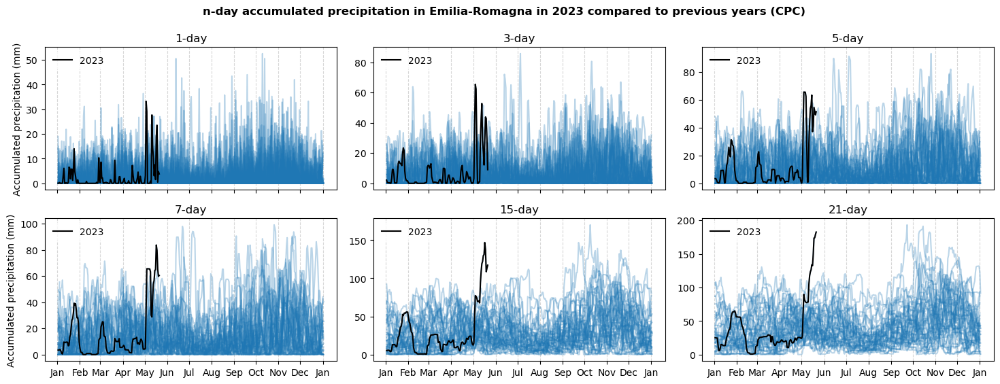

In [11]:
sf = gpd.read_file("sf/italy-adm1").set_index("NAME_1").loc[["Emilia-Romagna"]]

cpc = xr.open_dataset("data/cpc_daily_9-14-42-46.nc").precip
cpc_ts = cpc.where(regionmask.mask_3D_geopandas(sf, cpc.lon, cpc.lat, numbers = "ID_1").squeeze(drop = True) == 1).mean(["lat", "lon"]).load()

fig, axs = plt.subplots(ncols = 3, nrows = 2, figsize = (18,6), sharex = True, sharey = False)
plt.subplots_adjust(hspace = 0.2, wspace = 0.125)

ndays = [1,3,5,7,15,21]

for i in range(6):
    
    ax = fig.axes[i]
    nd = ndays[i]
    ts = cpc_ts.rolling(time = nd, center = False).sum()
    
    # plot each year individually so that the overlapping transparencies interact
    for y in set(ts.time.dt.year.values): 
        ax.plot(ts.sel(time = str(y)).time.dt.dayofyear, ts.sel(time = str(y)), color = "tab:blue", alpha = 0.3)
        
    ax.plot(ts.sel(time = "2023").time.dt.dayofyear, ts.sel(time = "2023"), color = "k", label = "2023")
    ax.legend(edgecolor = "w", loc = "upper left")
    
    sc_xlabels(dates = cpc.sel(time = slice("20180101", "20190101")).time, ax = ax)
    
    ax.set_title(str(nd)+"-day")
    ax.grid(axis = "x", alpha = 0.5, ls = "--")
    
for ax in axs[:,0]: ax.set_ylabel("Accumulated precipitation (mm)")

fig.suptitle("n-day accumulated precipitation in Emilia-Romagna in 2023 compared to previous years (CPC)", fontweight = "bold")
plt.savefig("fig/cpc_n-day-precip_Emilia-Romagna.png")

### **Validation of gridded data**

In [2]:
cpc, chirps = [xr.open_dataset("data/"+ds+"_daily_9-13-43-46.nc").precip for ds in ["cpc", "chirps"]]
eobs = xr.open_dataset("data/rr_0.25deg_reg_v25.0ee_9-13E_43-46N.nc").rr
mswep = xr.open_mfdataset("data/mswep_daily_9-13-43-46_*.nc").precip.load()

fl = sorted(glob.glob("data/pgdcngts*.nc")) + sorted(glob.glob("data/peca*.nc")) 

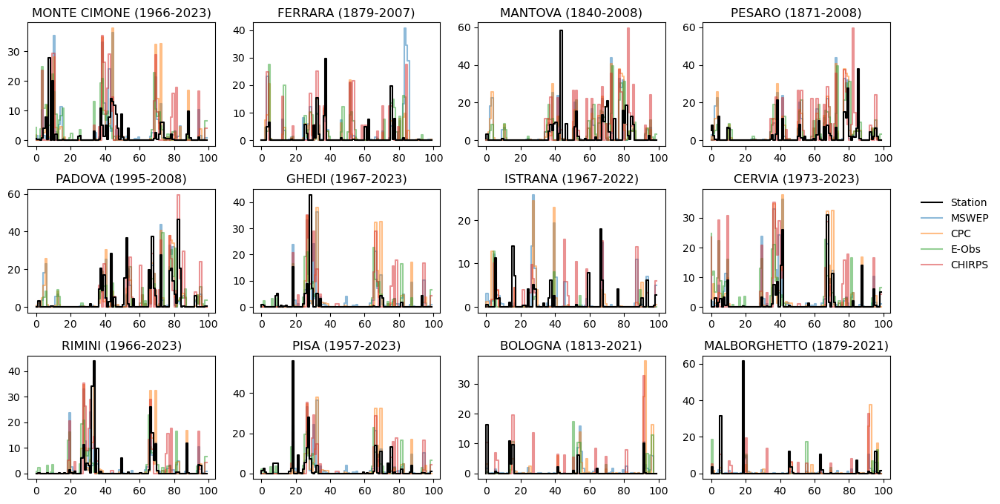

In [14]:
# in the absence of anything more sensible, look at the last 100 observations
fig, axs = plt.subplots(ncols = 4, nrows = 3, figsize = (15,8), dpi = 100)
plt.subplots_adjust(hspace = 0.35)

for i in range(len(fl)):
    
    fnm = fl[i]
    ax = fig.axes[i]
    
    da = xr.open_dataset(fnm).dropna("time", "any")
    
    lat = float(da.latitude.strip().split(" ")[0])
    lon = float(da.longitude.strip().split(" ")[0])
    stn = da.description + " ("+"-".join([str(d) for d in da.isel(time = [0,-1]).time.dt.year.values])+")"
    
    mswep_px = nearest_px(lon, lat, mswep, xcoord = "lat", ycoord = "lon")
    cpc_px = nearest_px(lon, lat, cpc, xcoord = "lat", ycoord = "lon")
    eobs_px = nearest_px(lon, lat, eobs, xcoord = "lat", ycoord = "lon")
    chirps_px = nearest_px(lon, lat, chirps, xcoord = "lat", ycoord = "lon")
    
    if "peca" in fnm:
        da = da.rr
    else:
        da = da.PRCP
    zz = xr.concat([da, mswep_px, cpc_px, eobs_px, chirps_px], "new").dropna("time", "any")
    
    ax.plot(zz.isel(new = 0, time = slice(-100,None)), color = "k", label = "Station", drawstyle = "steps", zorder = 99)
    ax.plot(zz.isel(new = 1, time = slice(-100,None)), label = "MSWEP", drawstyle = "steps", alpha = 0.5)
    ax.plot(zz.isel(new = 2, time = slice(-100,None)), label = "CPC", drawstyle = "steps", alpha = 0.5)
    ax.plot(zz.isel(new = 3, time = slice(-100,None)), label = "E-Obs", drawstyle = "steps", alpha = 0.5)
    ax.plot(zz.isel(new = 4, time = slice(-100,None)), label = "CHIRPS", drawstyle = "steps", alpha = 0.5)
    ax.set_title(stn)
    
fig.legend(["Station", "MSWEP", "CPC", "E-Obs", "CHIRPS"], bbox_to_anchor = (0.92,0.6), loc = "upper left", edgecolor = "w")
plt.savefig("fig/station-validation.png")

### **Annual maxima of different accumulations**

In [97]:
sf = gpd.read_file("sf_emilia-romagna")

mswep = xr.open_mfdataset("data/mswep_daily_9-14-42-46_*.nc").precip
cpc = xr.open_dataset("data/cpc_daily_9-14-42-46.nc").precip
era5 = xr.open_dataset("data/era5_tp_daily_eu_extended_9-13E_43-46N.nc").tp

mswep_ts, cpc_ts, era5_ts = [da.where(regionmask.mask_3D_geopandas(sf, da.lon, da.lat, numbers = "ID_1").squeeze(drop = True) == 1).mean(["lat", "lon"]).load() for da in [mswep, cpc, era5]]

In [98]:
rxnday = {nd : [ts.rolling(time = nd, center = False).sum().sel(time = [m in [4,5,6] for m in ts.time.dt.month]).resample(time = "AS-JAN").max() for ts in [mswep_ts, cpc_ts, era5_ts]] for nd in [15,21]}

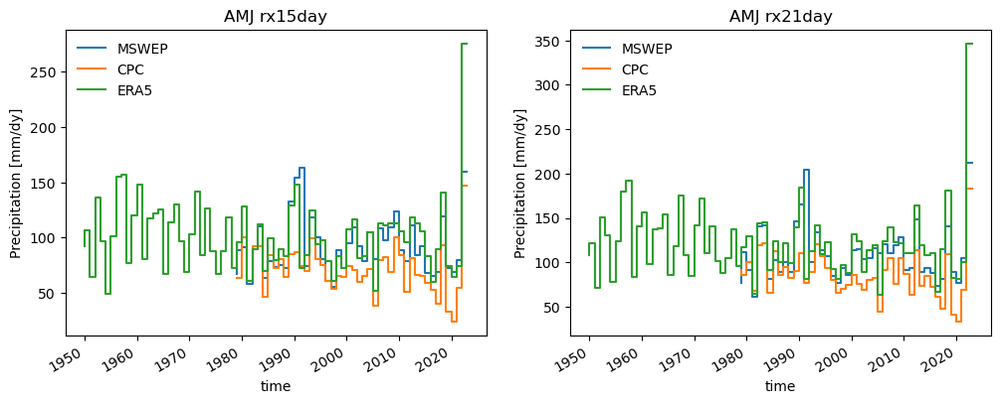

In [101]:
fig, axs = plt.subplots(ncols = len(rxnday), figsize = (6*len(rxnday),4), dpi = 100)

for i in range(len(rxnday)):
    
    ax = axs[i]
    nd = list(rxnday.keys())[i]
    
    rxnday[nd][0].plot(ax = ax, drawstyle = "steps", label = "MSWEP")
    rxnday[nd][1].plot(ax = ax, drawstyle = "steps", label = "CPC")
    rxnday[nd][2].plot(ax = ax, drawstyle = "steps", label = "ERA5")
    
    ax.set_title("AMJ rx"+str(nd)+"day")
    ax.legend(edgecolor = "w")
    
plt.savefig("fig/obs_rxnday_emilia-romagna.png")
    

---
## **Time series**

### **Gridded products**

In [2]:
mswep = xr.open_mfdataset("data/mswep_daily_9-14-42-46_*.nc").precip
era5 = xr.open_dataset("data/era5_tp_daily_eu_extended_9-13E_43-46N.nc").tp

sf = gpd.read_file("sf_emilia-romagna")
mswep_ts, era5_ts = [da.where(regionmask.mask_3D_geopandas(sf, da.lon, da.lat, numbers = "ID_1").squeeze(drop = True) == 1).mean(["lat", "lon"]).load() for da in [mswep, era5]]

In [3]:
## SAVE DAILY TIME SERIES FOR FURTHER ANALYSIS
mswep_ts.to_netcdf("data/mswep_emilia-romagna-ts.nc")
era5_ts.rename("precip").to_netcdf("data/era5_emilia-romagna-ts.nc")

In [38]:
mswep_ts.to_dataframe().to_csv("data/mswep_emilia-romagna-ts.csv")
era5_ts.to_dataframe().to_csv("data/era5_emilia-romagna-ts.csv")

In [36]:
## TIME SERIES FOR CLIMATE EXPLORER
for ds_nm in ["mswep", "era5"]:

    # load data, compute index
    ts = xr.open_dataset("data/"+ds_nm+"_emilia-romagna-ts.nc").precip
    ts = ts.rolling(time = 21, center = False).sum().sel(time = [m in [4,5,6] for m in ts.time.dt.month]).resample(time = "AS-JAN").max()
    

    # fix filename
    csv_fnm = "ts/Italy-floods_rx21day-amj_"+ds_nm+".dat"
    if len(csv_fnm.split("/")[-1]) > 65: print("! Filename too long: ", csv_fnm)
    
    # create extra header lines for upload to Climate Explorer 
    str1 = "# contact :: "+ds_nm.upper()+" rx21day-AMJ - Italy floods 2023, c.barnes22@imperial.ac.uk"
    str2 = "# rx1day [mm] April/May/June maxima of 21-day accumulated precipitation over Emilia-Romagna region at "+re.sub(".dat", "", csv_fnm.split("/")[-1])
    head = "# year rx21day"
    
    # make .dat file
    ! echo "$str1 " > $csv_fnm
    ! echo "$str2" >> $csv_fnm
    ! echo "$head" >> $csv_fnm
    ts.assign_coords(time = ts.time.dt.year).dropna("time", "any").to_dataframe().to_csv(csv_fnm, sep = " ", mode = "a", header = False)

In [20]:
# Smoothed GMST time series: create CSV with headers for upload to Climate Explorer

gmst = pd.read_csv("../90_data/gmst.dat", comment = "#", sep = " +", engine = "python", header = None, names = ["year","gmst"], index_col = "year")

csv_fnm = "ts/Italy-floods_gmst-smoothed.dat"
str1 = "# contact :: smoothed GMST - Italy floods 2023, c.barnes22@imperial.ac.uk"
str2 = "# gmst [decC] May 2023 snapshot of giss_al_gl_m_4yrlo from KNMI Climate Explorer at "+re.sub(".dat", "", csv_fnm.split("/")[-1])
head = "# year gmst"

! echo "$str1 " > $csv_fnm
! echo "$str2" >> $csv_fnm
! echo "$head" >> $csv_fnm

gmst.to_csv(csv_fnm, sep = " ", mode = "a", header = False)

### **CORDEX**

In [ ]:
# quickly extract rx21day & save as txt file for easier processing in R
for fnm in glob.glob("cordex/*ts.nc"):
    
    ts = xr.open_dataset(fnm).pr
    ts = ts.rolling(time = 21, center = False).sum().sel(time = [m in [4,5,6] for m in ts.time.dt.month]).resample(time = "AS-JAN").max()
    
    # fix filename
    csv_fnm = "ts/Italy-floods_rx21day-amj_"+fnm.split("_")[1]+"_"+cordex_model(fnm)+".dat"
    if len(csv_fnm.split("/")[-1]) > 65: print("! Filename too long: ", csv_fnm)
    
    # create extra header lines for upload to Climate Explorer 
    str1 = "# contact :: CORDEX EUR-11 "+cordex_model(fnm)+" rx21day-AMJ - Italy floods 2023, c.barnes22@imperial.ac.uk"
    str2 = "# rx1day [mm] April/May/June maxima of 21-day accumulated precipitation over Emilia-Romagna region at "+re.sub(".dat", "", csv_fnm.split("/")[-1])
    head = "# year rx21day"
    
    # make .dat file
    ! echo "$str1 " > $csv_fnm
    ! echo "$str2" >> $csv_fnm
    ! echo "$head" >> $csv_fnm
    ts.assign_coords(time = ts.time.dt.year).dropna("time", "any").to_dataframe().to_csv(csv_fnm, sep = " ", mode = "a", header = False)

In [11]:
# copy required CMIP5 GMST files to study folder
for gcm in list(set(["_rcp85_".join(cordex_model(fnm).split("_")[:2]) for fnm in glob.glob("cordex/*ts.nc")])):
    
    gsat_fnm = glob.glob("../00_gsat/cmip5_smoothed-gsat*"+gcm+".dat")
    if len(gsat_fnm) == 0:
        print("No GSAT:", gcm)
        continue
        
    gsat_fnm = gsat_fnm[0]
    new_fnm = "ts/Italy-floods_"+gsat_fnm.split("/")[-1]
    if len(new_fnm.split("/")[-1]) > 65: print("Filename too long:", new_fnm)
    
    ! cp $gsat_fnm $new_fnm

### **UKCP18 regional**

In [85]:
# quickly extract rx21day & save as txt file for easier processing in R
for fnm in sorted(glob.glob("ukcp/*ts.nc")):
    
    ens = fnm[-12:-10]
    ts = xr.open_dataset(fnm).pr
    ts = ts.rolling(time = 21, center = False).sum().sel(time = [m in [4,5,6] for m in ts.time.dt.month]).resample(time = "AS-JAN").max()
    
    # fix filename
    csv_fnm = "ts/Italy-floods_rx21day-amj_UKCP18-12km_"+ens+".dat"
    
    # create extra header lines for upload to Climate Explorer 
    str1 = "# contact :: UKCP18 12km "+ens+" rx21day-AMJ - Italy floods 2023, c.barnes22@imperial.ac.uk"
    str2 = "# rx1day [mm] April/May/June maxima of 21-day accumulated precipitation over Emilia-Romagna region at "+re.sub(".dat", "", csv_fnm.split("/")[-1])
    head = "# year rx21day"
    
    # make .dat file
    ! echo "$str1 " > $csv_fnm
    ! echo "$str2" >> $csv_fnm
    ! echo "$head" >> $csv_fnm
    
    ts.assign_coords(time = ts.time.dt.year).dropna("time", "any").to_dataframe().to_csv(csv_fnm, sep = " ", mode = "a", header = False)

In [86]:
# copy GMST files to study folder
for ens in [fnm[-12:-10] for fnm in sorted(glob.glob("ukcp/*ts.nc"))]:
    
    gsat_fnm = glob.glob("../00_gsat/ukcp-land-gcm_gsat*"+ens+".dat")[0]
    
    new_fnm = "ts/Italy-floods_"+gsat_fnm.split("/")[-1]
    if len(new_fnm.split("/")[-1]) > 65: print("Filename too long:", new_fnm)
    
    ! cp $gsat_fnm $new_fnm

---
## **Model evaluation**

### **CORDEX**

#### **Spatial pattern of May precipitation**

In [52]:
# # compute spatial climatology (quite slow for MSWEP)
# mswep_sp = [xr.open_mfdataset("/home/clair/Data/mswep_past/"+str(y)+"*.nc").sel(lon = slice(5,21), lat = slice(51,34)).groupby("time.month")[5].precipitation for y in range(1979, 2021)]
# mswep_sp = mswep_sp + [xr.open_mfdataset("/home/clair/Data/mswep_nrt/"+str(y)+"*.nc").sel(lon = slice(5,21), lat = slice(51,34)).groupby("time.month")[5].precipitation for y in range(2021, 2023)]

# mswep_sp = xr.concat(mswep_sp, "time").mean("time")
# mswep_sp.to_netcdf("data/mswep_spatial_may.nc")

In [80]:
mswep = xr.open_dataset("data/mswep_spatial_may.nc").precipitation
era5 = decode_times(xr.open_dataset("data/era5_tp_daily_eu_5-21E_34-51N_su.62f4b5a82fde776a4c64f0ca33646aa0.info_12_mean_30.nc", decode_times = False)).tp
era5 = era5.sel(time = slice(None, "2022")).groupby("time.month")[5].mean("time").load()

sf = gpd.read_file("sf_emilia-romagna")

In [81]:
# group CORDEX models by RCM
fl = sorted(glob.glob("cordex/*sp.nc"))
fl_dict = {"_".join([fnm.split("_")[i] for i in [5,2,4]]) : fnm for fnm in fl}
fl = [fl_dict[k] for k in sorted(fl_dict.keys())]

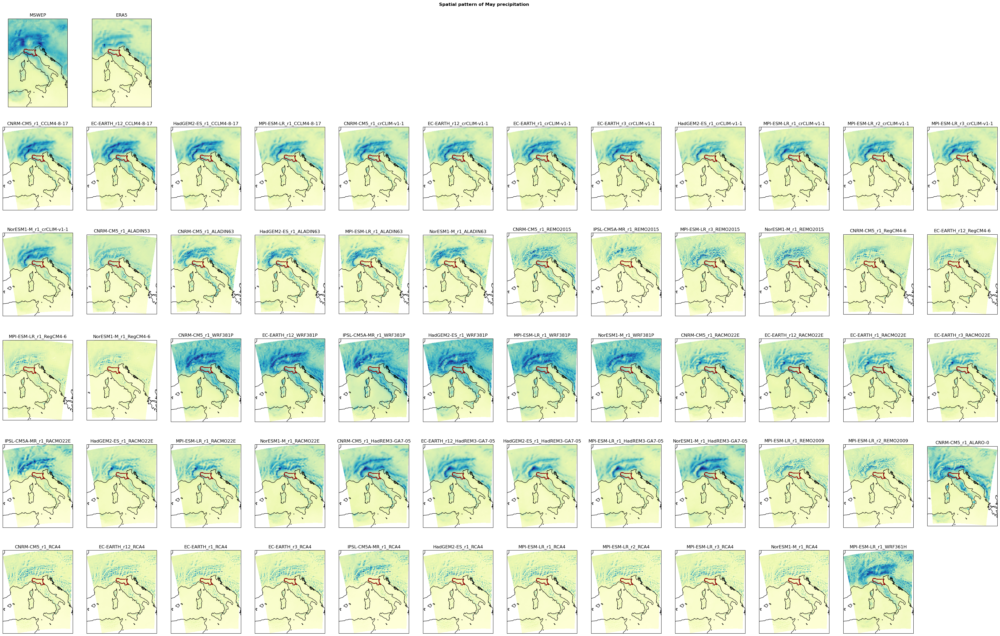

In [82]:
nc = 12

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "YlGnBu", "vmin" : 0}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
# plt.subplots_adjust(wspace = 0.01)

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# reference patterns from observations - MSWEP & ERA5
mswep.assign_attrs(long_name = "Precip").plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("MSWEP")
era5.assign_attrs(long_name = "Precip").plot(ax = axs[0,1], add_colorbar = False, **plot_kws) 
axs[0,1].set_title("ERA5")

# turn off remaining axes in top row
for ax in axs[0,:2]: 
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
for ax in axs[0,2:]: ax.set_axis_off()
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# CORDEX model output
for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sp = convert_units_to(xr.open_dataset(fnm).pr.sel(month = 5), "mm/month")
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(pr_sp.lon, pr_sp.lat, pr_sp, **plot_kws)
    ax.set_title(cordex_model(fnm))
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
    
fig.suptitle("Spatial pattern of May precipitation", fontweight = "bold", y = 0.9)

plt.savefig("fig/cordex_spatial_pr-may.png")

#### **Seasonal cycle in Emilia-Romagna**

In [143]:
mswep = xr.open_mfdataset("data/mswep_daily_9-14-42-46_*.nc").precip.sel(time = slice(None, "2022"))
era5 = xr.open_dataset("data/era5_tp_daily_eu_extended_9-13E_43-46N.nc").tp.sel(time = slice(None, "2022"))

sf = gpd.read_file("sf_emilia-romagna")
mswep_ts, era5_ts = [da.where(regionmask.mask_3D_geopandas(sf, da.lon, da.lat, numbers = "ID_1").squeeze(drop = True) == 1).mean(["lat", "lon"]).load() for da in [mswep, era5]]
mswep_sc, era5_sc = [ts.groupby("time.dayofyear").mean() for ts in [mswep_ts, era5_ts]]

# will compare scaled precip: don't care about value, just about timing of peaks etc (also: ERA5 & MSWEP scaled precip are v similar)
def scale(ts): return((ts - ts.mean()) / ts.std())

# also get smoothed ts for correlations
mswep_ts7 = mswep_ts.rolling(time = 7, center = True).mean().groupby("time.dayofyear").mean()

In [81]:
# group CORDEX models by RCM
fl = sorted(glob.glob("cordex/*ts.nc"))
fl_dict = {"_".join([fnm.split("_")[i] for i in [5,2,4]]) : fnm for fnm in fl}
fl = [fl_dict[k] for k in sorted(fl_dict.keys())]

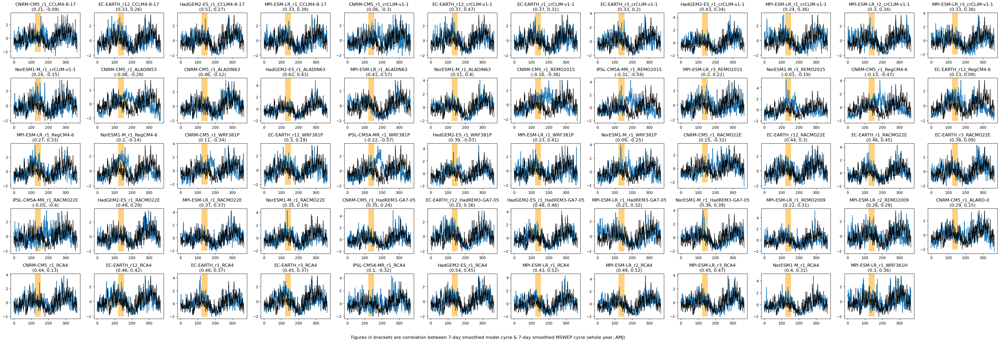

In [191]:
nc = 12

nr = int(np.ceil(len(fl) / nc))

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*3), dpi = 100)
plt.subplots_adjust(hspace = 0.45)

for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sc = xr.open_dataset(fl[i]).sel(time = slice("1979", "2022")).pr.groupby("time.dayofyear").mean()
    pr_sc7 = xr.open_dataset(fl[i]).sel(time = slice("1979", "2022")).pr.rolling(time = 7, center = True).mean().groupby("time.dayofyear").mean()
    
    ax = fig.axes[i]
    ax.plot(scale(pr_sc))
    ax.plot(scale(mswep_sc), color = "k", lw = 1)
    ax.set_title(cordex_model(fnm)+"\n("+str(xr.corr(pr_sc, mswep_ts7).round(2).values)+", "+
          str(xr.corr(pr_sc.sel(dayofyear = slice(92, 182)), mswep_ts7.sel(dayofyear = slice(92, 182))).round(2).values)+")")
    
    # highlight the short & long rains thar we're interested in
    ylim = ax.get_ylim()
    ax.add_patch(Rectangle((datetime(2020,5,1).timetuple().tm_yday, -2), width = 31, height = 500, color = "orange", alpha = 0.5))
    ax.set_ylim(ylim)
    
if len(fl) < (nr * nc):
    for ax in fig.axes[len(fl):]: ax.set_axis_off()
    
fig.suptitle("Seasonal cycle over Emilia-Romagna in EuroCORDEX models (1980-2023) & MSWEP", fontweight = "bold", y = 0.95)

fig.text(0.5, 0.06, "Figures in brackets are correlation between 7-day smoothed model cycle & 7-day smoothed MSWEP cycle (whole year, AMJ)", ha = "center", fontsize = "large")
    
plt.savefig("fig/cordex_seasonal_pr.png")

---
### **UKCP18 regional**

#### **Spatial pattern of May precipitation**

In [79]:
mswep = xr.open_dataset("data/mswep_spatial_may.nc").precipitation
era5 = decode_times(xr.open_dataset("data/era5_tp_daily_eu_5-21E_34-51N_su.62f4b5a82fde776a4c64f0ca33646aa0.info_12_mean_30.nc", decode_times = False)).tp
era5 = era5.sel(time = slice(None, "2022")).groupby("time.month")[5].mean("time").load()

sf = gpd.read_file("sf_emilia-romagna")

fl = sorted(glob.glob("ukcp/*sp.nc"))

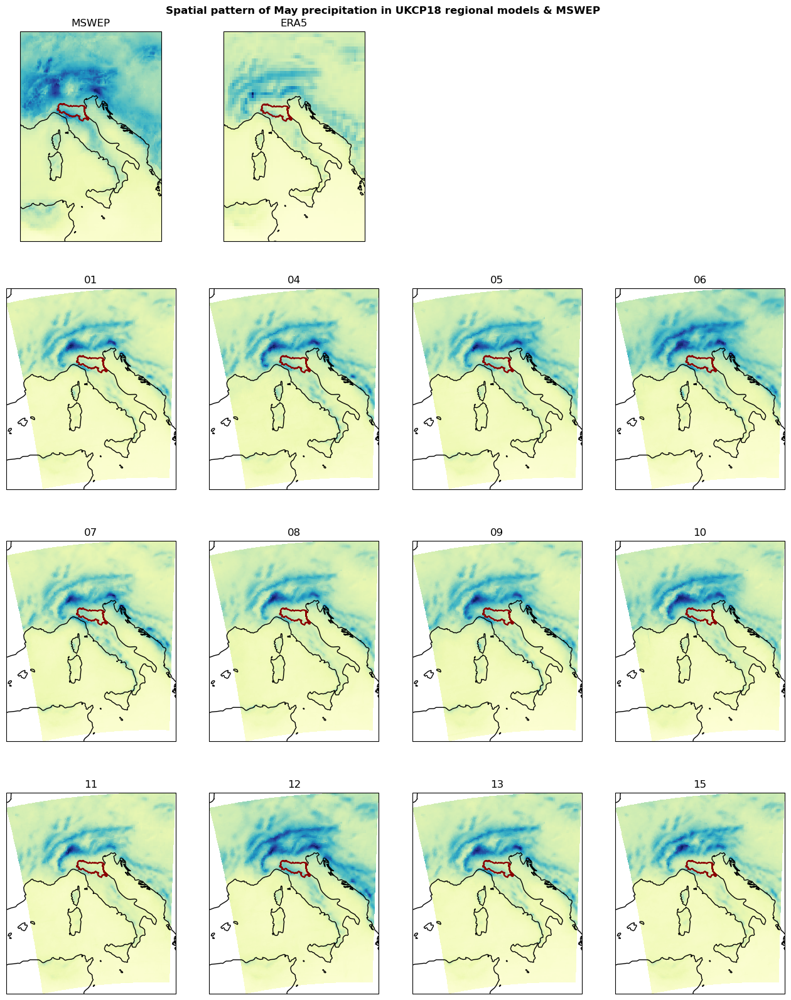

In [78]:
nc = 4

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "YlGnBu", "vmin" : 0}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
# plt.subplots_adjust(wspace = 0.01)

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# reference patterns from observations - MSWEP & ERA5
mswep.assign_attrs(long_name = "Precip").plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("MSWEP")
era5.assign_attrs(long_name = "Precip").plot(ax = axs[0,1], add_colorbar = False, **plot_kws) 
axs[0,1].set_title("ERA5")

# turn off remaining axes in top row
for ax in axs[0,:2]: 
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
for ax in axs[0,2:]: ax.set_axis_off()
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# UKCP model output
for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sp = xr.open_dataset(fnm).pr
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(pr_sp.lon, pr_sp.lat, pr_sp, **plot_kws)
    ax.set_title(fnm[-12:-10])
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
    
fig.suptitle("Spatial pattern of May precipitation in UKCP18 regional models", fontweight = "bold", y = 0.92)
plt.savefig("fig/ukcp18_spatial_pr-may.png")

#### **Seasonal cycle in Emilia-Romagna**

In [75]:
mswep = xr.open_mfdataset("data/mswep_daily_9-14-42-46_*.nc").precip.sel(time = slice(None, "2022"))
era5 = xr.open_dataset("data/era5_tp_daily_eu_extended_9-13E_43-46N.nc").tp.sel(time = slice(None, "2022"))

sf = gpd.read_file("sf_emilia-romagna")
mswep_ts, era5_ts = [da.where(regionmask.mask_3D_geopandas(sf, da.lon, da.lat, numbers = "ID_1").squeeze(drop = True) == 1).mean(["lat", "lon"]).load() for da in [mswep, era5]]
mswep_sc, era5_sc = [ts.groupby("time.dayofyear").mean() for ts in [mswep_ts, era5_ts]]

# will compare scaled precip: don't care about value, just about timing of peaks etc (also: ERA5 & MSWEP scaled precip are v similar)
def scale(ts): return((ts - ts.mean()) / ts.std())

# also get smoothed ts for correlations
mswep_ts7 = mswep_ts.rolling(time = 7, center = True).mean().groupby("time.dayofyear").mean()

# group CORDEX models by RCM
fl = sorted(glob.glob("ukcp/*ts.nc"))

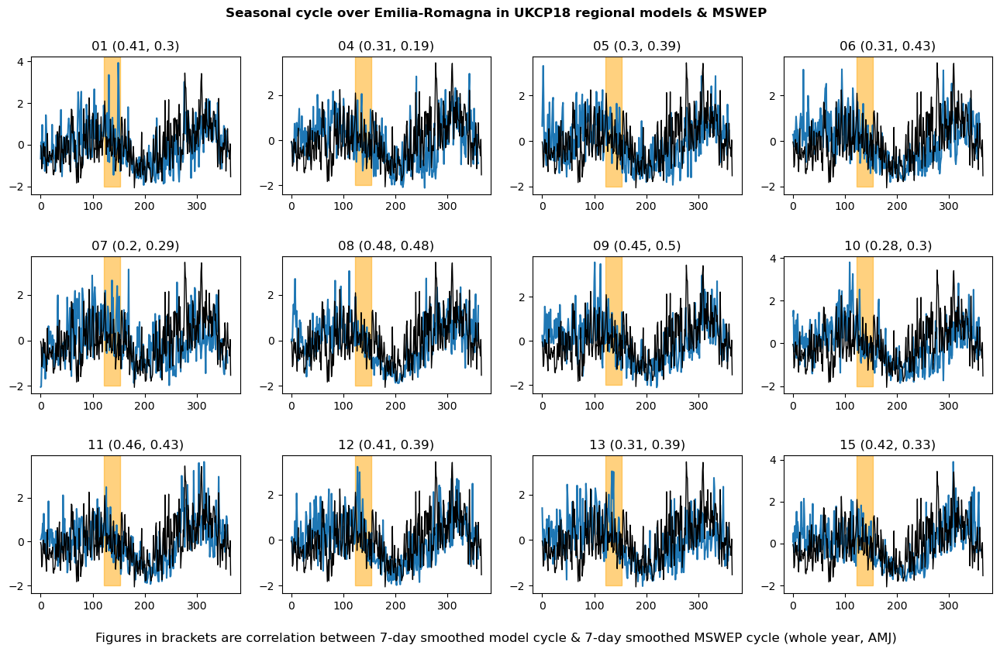

In [76]:
nc = 4

nr = int(np.ceil(len(fl) / nc))

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*3), dpi = 100)
plt.subplots_adjust(hspace = 0.45)

for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sc = xr.open_dataset(fl[i]).sel(time = slice("1979", "2022")).pr.groupby("time.dayofyear").mean()
    pr_sc7 = xr.open_dataset(fl[i]).sel(time = slice("1979", "2022")).pr.rolling(time = 7, center = True).mean().groupby("time.dayofyear").mean()
    
    ax = fig.axes[i]
    ax.plot(scale(pr_sc))
    ax.plot(scale(mswep_sc), color = "k", lw = 1)
    ax.set_title(fnm[-12:-10]+" ("+str(xr.corr(pr_sc, mswep_ts7).round(2).values)+", "+
          str(xr.corr(pr_sc.sel(dayofyear = slice(92, 182)), mswep_ts7.sel(dayofyear = slice(92, 182))).round(2).values)+")")
    
    # highlight the short & long rains thar we're interested in
    ylim = ax.get_ylim()
    ax.add_patch(Rectangle((datetime(2020,5,1).timetuple().tm_yday, -2), width = 31, height = 500, color = "orange", alpha = 0.5))
    ax.set_ylim(ylim)
    
if len(fl) < (nr * nc):
    for ax in fig.axes[len(fl):]: ax.set_axis_off()

fig.suptitle("Seasonal cycle over Emilia-Romagna in UKCP18 regional models & MSWEP", fontweight = "bold", y = 0.95)
fig.text(0.5, 0.04, "Figures in brackets are correlation between 7-day smoothed model cycle & 7-day smoothed MSWEP cycle (whole year, AMJ)", ha = "center", fontsize = "large")
    
plt.savefig("fig/ukcp_seasonal_pr.png")

---
## **Trends in short-duration high-intensity rainfall**

In [57]:
mswep = xr.open_dataset("data/mswep_emilia-romagna-ts.nc").precip

n = 1
q = 0.99

rxnday = mswep.rolling(time = n).sum()
mswep_th = rx2day.where(rx2day >= rx2day.quantile(q))
mswep_wetdays = mswep_th.dropna("time", "all")

Text(0.5, 1.0, '# days between events')

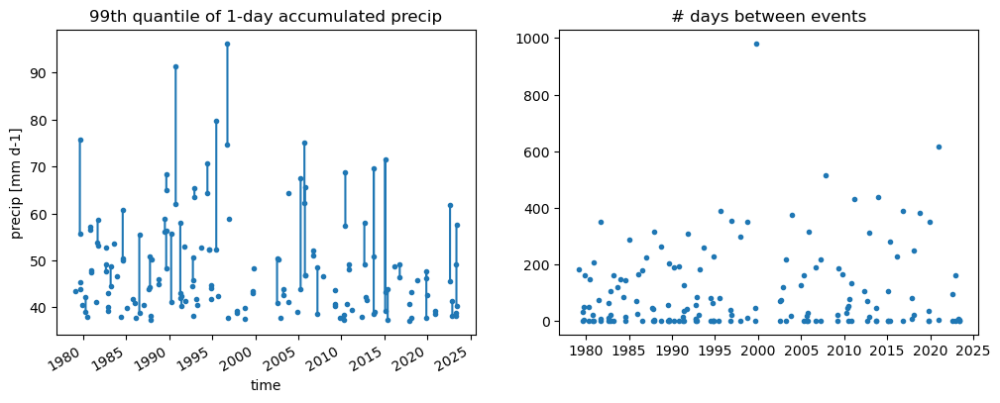

In [115]:
fig, axs = plt.subplots(ncols = 2, figsize = (12,4), dpi = 100)

mswep_th.plot(ax = axs[0], marker = ".")
axs[0].set_title(str(int(q*100))+"th quantile of "+str(n)+"-day accumulated precip")

axs[1].plot(mswep_wetdays.time[:-1], np.diff([np.timedelta64(d - np.datetime64("1979-01-01"), "D") for d in mswep_wetdays.time.values]), ls = "", marker = ".")
axs[1].set_title("# days between events")